In [1]:
from itertools import product
from tqdm.auto import tqdm

import plotly.graph_objects as go
import numpy as np
import pandas as pd

import optimizers
import datagen
import losses
from poly_function import Polynom
from datagen import generate_data

# Лаборатона робота 2

1. Реалізувати квадратичну функції 𝑓(𝑥) = 𝑎𝑥 2 + 𝑏𝑥 + 𝑐
2. Згенерувати датасет розміру N, де $𝑥_𝑖 = 𝑓(𝑧_𝑖 ) + 𝜖_𝑖$
3. Реалізувати оптимізатор opt
4. Зробити K ітерацій градієнтного спуску opt з розміром батчу B (втрата mse)
5. Обчислити mse між справжніми параметрами та отриманими

---
𝑎 = 3, 𝑏 = −2, 𝑐 = 1

𝑁 = 10000, 𝑧$\sim$𝑈(0, 2), 𝜖~𝑁(0, $\sigma^2$ ), 𝜎 = {0.01, 0.1, 0.3, 0.5, 1, 10}

𝑜𝑝𝑡 − {𝑆𝐺𝐷, 𝑀𝑜𝑚𝑒𝑛𝑡𝑢𝑚}, 𝑙𝑟 = 0.01

𝐾 = {10, 30, 100, 1000}, 𝐵 = {1, 8, 32, 64}

In [2]:
a, b, c = 3, -2, 1
x_bounds = (0, 2)
N = 10000
lr = 0.01
x_plotting = np.linspace(*x_bounds, 50)

etalon_polynom = Polynom()
etalon_polynom.weights = np.array([a, b, c])

## Одиничний приклад

In [3]:
sigma = 0.01
K = 10
B = 1

x, y = generate_data(a, b, c, N, sigma)
poly_fn = Polynom()
loss_fn = losses.MSELoss()
optimizer = optimizers.SGD(
    poly_fn,
    loss_fn,
    lr,
)
loss_history = optimizer.fit(x, y, K, B)
print("a={:.4f}, b={:.4f}, c={:.4f}".format(*poly_fn.weights))
print(f"Etalon MSE: {loss_fn(etalon_polynom.weights, poly_fn.weights)}")

Model:   0%|          | 0/10 [00:00<?, ?it/s]

a=2.9987, b=-2.0000, c=0.9998
Etalon MSE: 5.570868033890517e-07


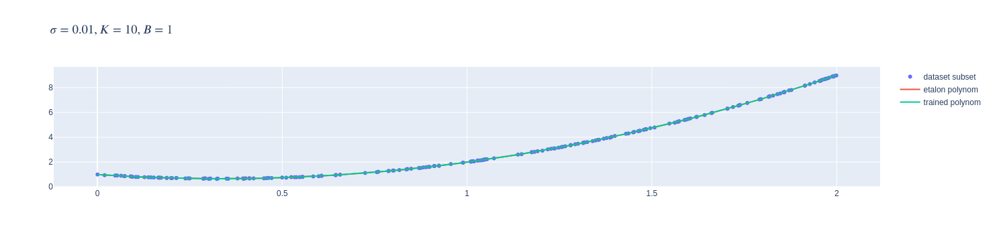

In [4]:
subset_idx = np.random.choice(range(len(x)), 200)
fig = go.Figure(
    [
        go.Scatter(
            x=x[subset_idx],
            y=y[subset_idx],
            mode="markers",
            name="dataset subset",
            showlegend=True,
        ),
        go.Scatter(
            x=x_plotting,
            y=etalon_polynom(x_plotting),
            name="etalon polynom",
            showlegend=True,
        ),
        go.Scatter(
            x=x_plotting,
            y=etalon_polynom(x_plotting),
            name="trained polynom",
            showlegend=True,
        ),
    ]
)
fig.update_layout(title=f"$\sigma={sigma}, K={K}, B={B}$")
fig.show()

# Загальні розрахунки

In [5]:
optimizer_classes = [optimizers.SGD, optimizers.Momentum]
K_list = [10, 30, 100, 1000]
B_list = [64, 32, 8, 1]

In [6]:
def fit(sigma: float) -> tuple[dict, list]:
    x, y = generate_data(a, b, c, N, sigma)
    history = {}
    records = []

    for B, K, optimizer_cls in tqdm(
        product(B_list, K_list, optimizer_classes),
        "Total",
        total=len(optimizer_classes) * len(K_list) * len(B_list),
    ):
        poly_fn = Polynom()
        loss_fn = losses.MSELoss()
        optimizer = optimizer_cls(
            poly_fn,
            loss_fn,
            lr,
        )
        loss_history = optimizer.fit(
            x, y, K, B, epoch_verbose=False, total_verbose=True, keep_total_pbar=False
        )
        etalon_mse = loss_fn(etalon_polynom.weights, poly_fn.weights)
        history[(optimizer_cls.__name__, K, B)] = {
            "loss_history": loss_history,
            "poly_fn": poly_fn,
            "etalon_mse": etalon_mse,
        }
        records.append(
            {
                "optimizer": optimizer_cls.__name__,
                "K": K,
                "B": B,
                "a": poly_fn.weights[0],
                "b": poly_fn.weights[1],
                "c": poly_fn.weights[2],
                "Etalon MSE": etalon_mse,
            }
        )
    return x, y, history, pd.DataFrame.from_records(records)


def plot_fitted_fns(x: np.ndarray, y: np.ndarray, sigma: float, history: dict):
    subset_idx = np.random.choice(range(len(x)), 200)
    fig = go.Figure(
        [
            go.Scatter(
                x=x[subset_idx],
                y=y[subset_idx],
                mode="markers",
                name="dataset subset",
                showlegend=True,
            ),
            go.Scatter(
                x=x_plotting,
                y=etalon_polynom(x_plotting),
                name="Etalon",
                showlegend=True,
            ),
        ]
        + [
            go.Scatter(
                x=x_plotting,
                y=data["poly_fn"](x_plotting),
                name=f"Optimizer: {opt_name}, K: {K}, B: {B}",
                showlegend=True,
            )
            for (opt_name, K, B), data in history.items()
        ]
    )
    fig.update_layout(title=f"$\sigma={sigma}$", height=800)
    fig.show()

    
def plot_loss_history(sigma: float, history: dict):
    fig = go.Figure(
        [
            go.Scatter(
                x=np.arange(0, len(data["loss_history"])),
                y=data["loss_history"],
                name=f"Optimizer: {opt_name}, K: {K}, B: {B}",
                showlegend=True,
            )
            for (opt_name, K, B), data in history.items()
        ]
    )
    fig.update_layout(title=f"$\sigma={sigma}$", height=800)
    fig.show()

### $\sigma=0.01$

In [7]:
sigma=0.01

In [8]:
x, y, history, records = fit(sigma)
records

Total:   0%|          | 0/32 [00:00<?, ?it/s]

Model:   0%|          | 0/10 [00:00<?, ?it/s]

Model:   0%|          | 0/10 [00:00<?, ?it/s]

Model:   0%|          | 0/30 [00:00<?, ?it/s]

Model:   0%|          | 0/30 [00:00<?, ?it/s]

Model:   0%|          | 0/100 [00:00<?, ?it/s]

Model:   0%|          | 0/100 [00:00<?, ?it/s]

Model:   0%|          | 0/1000 [00:00<?, ?it/s]

Model:   0%|          | 0/1000 [00:00<?, ?it/s]

Model:   0%|          | 0/10 [00:00<?, ?it/s]

Model:   0%|          | 0/10 [00:00<?, ?it/s]

Model:   0%|          | 0/30 [00:00<?, ?it/s]

Model:   0%|          | 0/30 [00:00<?, ?it/s]

Model:   0%|          | 0/100 [00:00<?, ?it/s]

Model:   0%|          | 0/100 [00:00<?, ?it/s]

Model:   0%|          | 0/1000 [00:00<?, ?it/s]

Model:   0%|          | 0/1000 [00:00<?, ?it/s]

Model:   0%|          | 0/10 [00:00<?, ?it/s]

Model:   0%|          | 0/10 [00:00<?, ?it/s]

Model:   0%|          | 0/30 [00:00<?, ?it/s]

Model:   0%|          | 0/30 [00:00<?, ?it/s]

Model:   0%|          | 0/100 [00:00<?, ?it/s]

Model:   0%|          | 0/100 [00:00<?, ?it/s]

Model:   0%|          | 0/1000 [00:00<?, ?it/s]

Model:   0%|          | 0/1000 [00:00<?, ?it/s]

Model:   0%|          | 0/10 [00:00<?, ?it/s]

Model:   0%|          | 0/10 [00:00<?, ?it/s]

Model:   0%|          | 0/30 [00:00<?, ?it/s]

Model:   0%|          | 0/30 [00:00<?, ?it/s]

Model:   0%|          | 0/100 [00:00<?, ?it/s]

Model:   0%|          | 0/100 [00:00<?, ?it/s]

Model:   0%|          | 0/1000 [00:00<?, ?it/s]

Model:   0%|          | 0/1000 [00:00<?, ?it/s]

,optimizer,K,B,a,b,c,Etalon MSE
0,SGD,10,64,2.805738,-1.587274,0.842291,7.765096e-02
1,Momentum,10,64,2.599200,-1.149666,0.673597,3.300827e-01
2,SGD,30,64,2.581363,-1.110572,0.660085,3.606272e-01
3,Momentum,30,64,2.900522,-1.789163,0.919001,2.030304e-02
4,SGD,100,64,2.991105,-1.981092,0.992811,1.627649e-04
5,Momentum,100,64,3.000368,-2.001066,1.000318,4.575104e-07
6,SGD,1000,64,3.000574,-2.001209,1.000500,6.799087e-07
7,Momentum,1000,64,3.000472,-2.001287,1.000403,6.800546e-07
8,SGD,10,32,2.671289,-1.301691,0.732232,2.224620e-01
9,Momentum,10,32,2.876560,-1.736807,0.898566,3.159900e-02


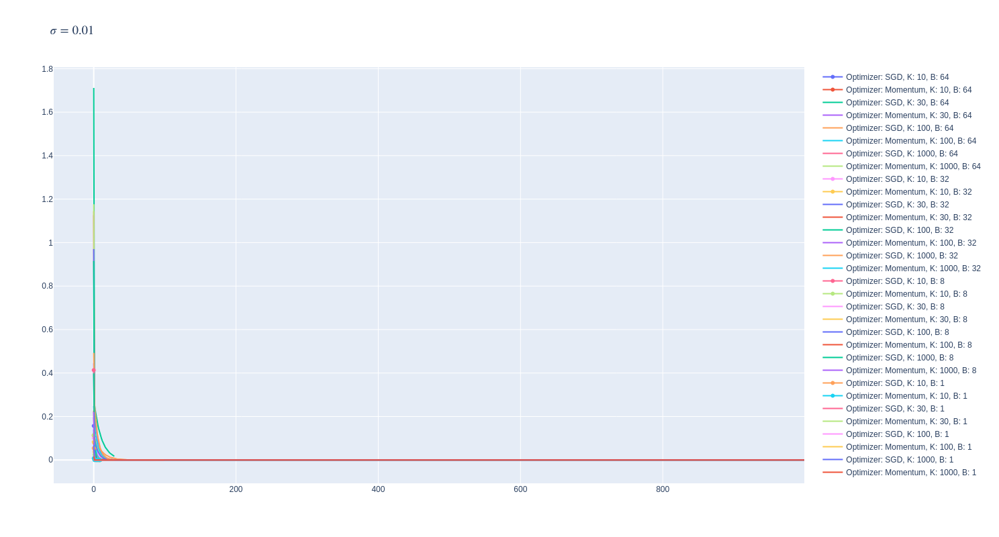

In [9]:
plot_loss_history(sigma, history)

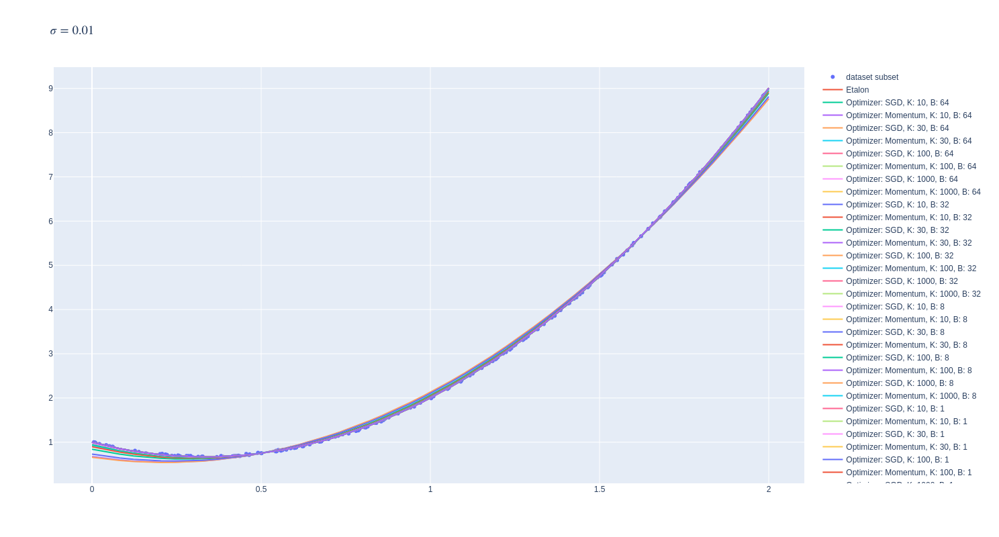

In [10]:
plot_fitted_fns(x, y, sigma, history)

### $\sigma=0.1$

In [11]:
sigma=0.1

In [12]:
x, y, history, records = fit(sigma)
records

Total:   0%|          | 0/32 [00:00<?, ?it/s]

Model:   0%|          | 0/10 [00:00<?, ?it/s]

Model:   0%|          | 0/10 [00:00<?, ?it/s]

Model:   0%|          | 0/30 [00:00<?, ?it/s]

Model:   0%|          | 0/30 [00:00<?, ?it/s]

Model:   0%|          | 0/100 [00:00<?, ?it/s]

Model:   0%|          | 0/100 [00:00<?, ?it/s]

Model:   0%|          | 0/1000 [00:00<?, ?it/s]

Model:   0%|          | 0/1000 [00:00<?, ?it/s]

Model:   0%|          | 0/10 [00:00<?, ?it/s]

Model:   0%|          | 0/10 [00:00<?, ?it/s]

Model:   0%|          | 0/30 [00:00<?, ?it/s]

Model:   0%|          | 0/30 [00:00<?, ?it/s]

Model:   0%|          | 0/100 [00:00<?, ?it/s]

Model:   0%|          | 0/100 [00:00<?, ?it/s]

Model:   0%|          | 0/1000 [00:00<?, ?it/s]

Model:   0%|          | 0/1000 [00:00<?, ?it/s]

Model:   0%|          | 0/10 [00:00<?, ?it/s]

Model:   0%|          | 0/10 [00:00<?, ?it/s]

Model:   0%|          | 0/30 [00:00<?, ?it/s]

Model:   0%|          | 0/30 [00:00<?, ?it/s]

Model:   0%|          | 0/100 [00:00<?, ?it/s]

Model:   0%|          | 0/100 [00:00<?, ?it/s]

Model:   0%|          | 0/1000 [00:00<?, ?it/s]

Model:   0%|          | 0/1000 [00:00<?, ?it/s]

Model:   0%|          | 0/10 [00:00<?, ?it/s]

Model:   0%|          | 0/10 [00:00<?, ?it/s]

Model:   0%|          | 0/30 [00:00<?, ?it/s]

Model:   0%|          | 0/30 [00:00<?, ?it/s]

Model:   0%|          | 0/100 [00:00<?, ?it/s]

Model:   0%|          | 0/100 [00:00<?, ?it/s]

Model:   0%|          | 0/1000 [00:00<?, ?it/s]

Model:   0%|          | 0/1000 [00:00<?, ?it/s]

,optimizer,K,B,a,b,c,Etalon MSE
0,SGD,10,64,1.946913,0.244181,0.139299,2.295382
1,Momentum,10,64,2.504771,-0.944691,0.597414,0.507002
2,SGD,30,64,2.787596,-1.547118,0.828714,0.093186
3,Momentum,30,64,2.919266,-1.826700,0.936702,0.013519
4,SGD,100,64,2.981969,-1.961288,0.988120,0.000655
5,Momentum,100,64,2.994180,-1.986110,0.998023,0.000077
6,SGD,1000,64,2.993796,-1.986488,0.997819,0.000075
7,Momentum,1000,64,2.994274,-1.986311,0.998100,0.000075
8,SGD,10,32,2.517675,-0.973672,0.608329,0.479798
9,Momentum,10,32,2.786930,-1.547369,0.828935,0.093179


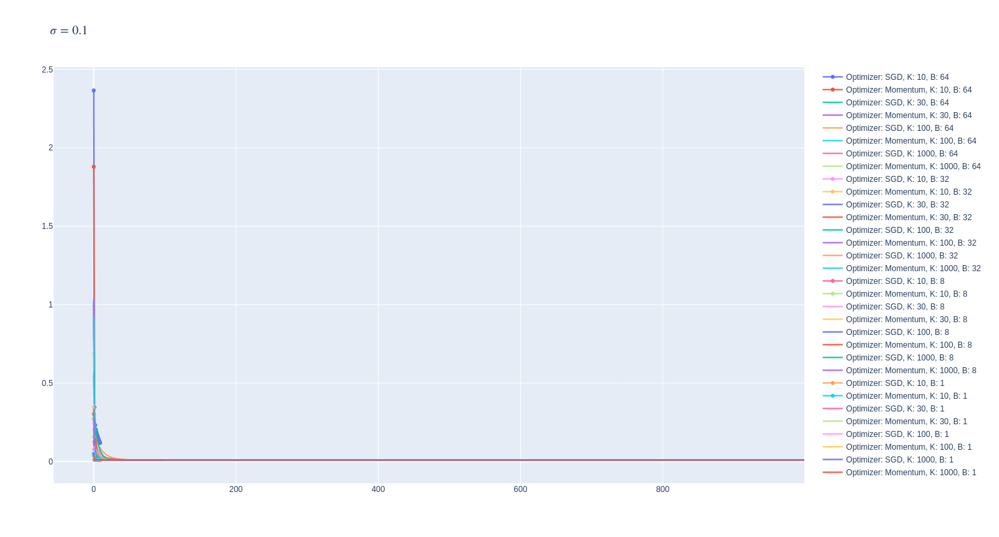

In [13]:
plot_loss_history(sigma, history)

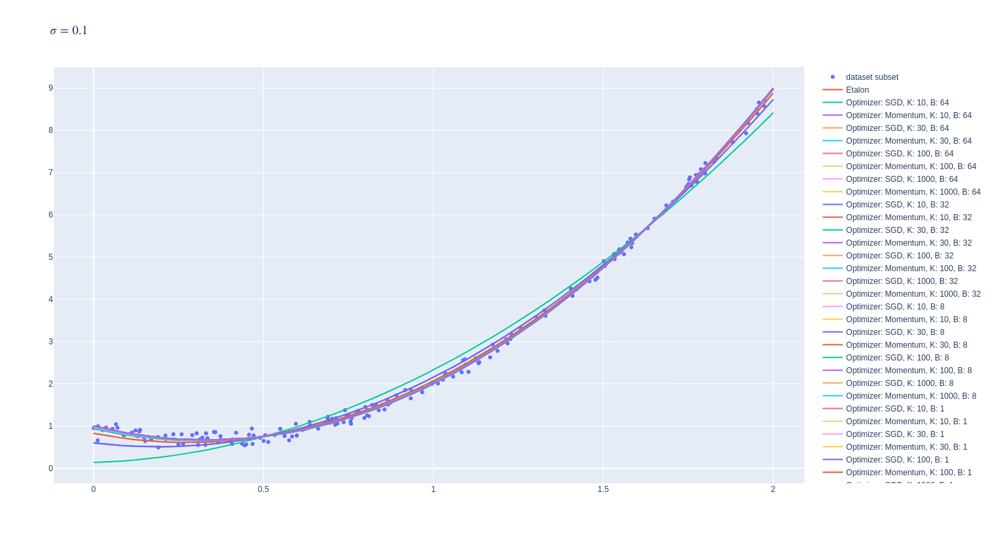

In [14]:
plot_fitted_fns(x, y, sigma, history)

### $\sigma=0.5$

In [15]:
sigma=0.5

In [16]:
x, y, history, records = fit(sigma)
records

Total:   0%|          | 0/32 [00:00<?, ?it/s]

Model:   0%|          | 0/10 [00:00<?, ?it/s]

Model:   0%|          | 0/10 [00:00<?, ?it/s]

Model:   0%|          | 0/30 [00:00<?, ?it/s]

Model:   0%|          | 0/30 [00:00<?, ?it/s]

Model:   0%|          | 0/100 [00:00<?, ?it/s]

Model:   0%|          | 0/100 [00:00<?, ?it/s]

Model:   0%|          | 0/1000 [00:00<?, ?it/s]

Model:   0%|          | 0/1000 [00:00<?, ?it/s]

Model:   0%|          | 0/10 [00:00<?, ?it/s]

Model:   0%|          | 0/10 [00:00<?, ?it/s]

Model:   0%|          | 0/30 [00:00<?, ?it/s]

Model:   0%|          | 0/30 [00:00<?, ?it/s]

Model:   0%|          | 0/100 [00:00<?, ?it/s]

Model:   0%|          | 0/100 [00:00<?, ?it/s]

Model:   0%|          | 0/1000 [00:00<?, ?it/s]

Model:   0%|          | 0/1000 [00:00<?, ?it/s]

Model:   0%|          | 0/10 [00:00<?, ?it/s]

Model:   0%|          | 0/10 [00:00<?, ?it/s]

Model:   0%|          | 0/30 [00:00<?, ?it/s]

Model:   0%|          | 0/30 [00:00<?, ?it/s]

Model:   0%|          | 0/100 [00:00<?, ?it/s]

Model:   0%|          | 0/100 [00:00<?, ?it/s]

Model:   0%|          | 0/1000 [00:00<?, ?it/s]

Model:   0%|          | 0/1000 [00:00<?, ?it/s]

Model:   0%|          | 0/10 [00:00<?, ?it/s]

Model:   0%|          | 0/10 [00:00<?, ?it/s]

Model:   0%|          | 0/30 [00:00<?, ?it/s]

Model:   0%|          | 0/30 [00:00<?, ?it/s]

Model:   0%|          | 0/100 [00:00<?, ?it/s]

Model:   0%|          | 0/100 [00:00<?, ?it/s]

Model:   0%|          | 0/1000 [00:00<?, ?it/s]

Model:   0%|          | 0/1000 [00:00<?, ?it/s]

,optimizer,K,B,a,b,c,Etalon MSE
0,SGD,10,64,1.889633,0.379685,0.099397,2.568967
1,Momentum,10,64,2.736649,-1.431640,0.787720,0.145817
2,SGD,30,64,2.561639,-1.057494,0.646712,0.401764
3,Momentum,30,64,2.958096,-1.905704,0.969523,0.003859
4,SGD,100,64,3.030726,-2.060703,1.028764,0.001819
5,Momentum,100,64,3.042586,-2.086575,1.038887,0.003607
6,SGD,1000,64,3.042872,-2.086679,1.038656,0.003615
7,Momentum,1000,64,3.042675,-2.086766,1.038960,0.003623
8,SGD,10,32,2.899556,-1.785167,0.922232,0.020763
9,Momentum,10,32,2.830341,-1.630706,0.857342,0.061838


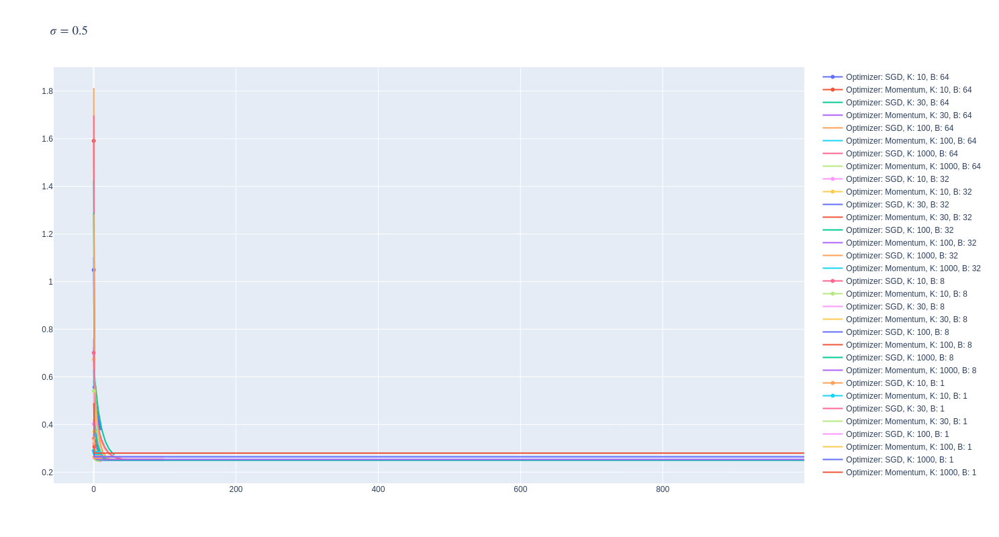

In [17]:
plot_loss_history(sigma, history)

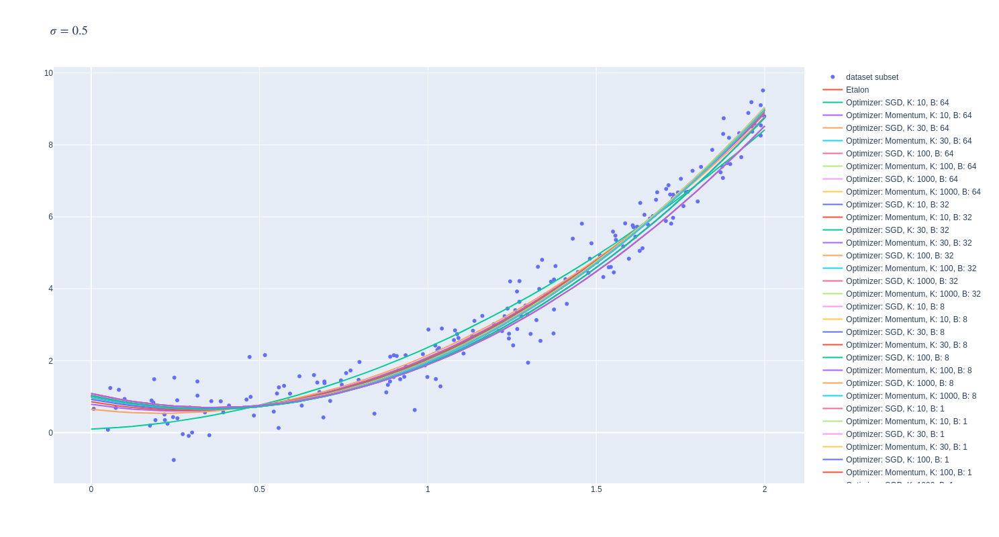

In [18]:
plot_fitted_fns(x, y, sigma, history)

### $\sigma=1$

In [19]:
sigma=1

In [20]:
x, y, history, records = fit(sigma)
records

Total:   0%|          | 0/32 [00:00<?, ?it/s]

Model:   0%|          | 0/10 [00:00<?, ?it/s]

Model:   0%|          | 0/10 [00:00<?, ?it/s]

Model:   0%|          | 0/30 [00:00<?, ?it/s]

Model:   0%|          | 0/30 [00:00<?, ?it/s]

Model:   0%|          | 0/100 [00:00<?, ?it/s]

Model:   0%|          | 0/100 [00:00<?, ?it/s]

Model:   0%|          | 0/1000 [00:00<?, ?it/s]

Model:   0%|          | 0/1000 [00:00<?, ?it/s]

Model:   0%|          | 0/10 [00:00<?, ?it/s]

Model:   0%|          | 0/10 [00:00<?, ?it/s]

Model:   0%|          | 0/30 [00:00<?, ?it/s]

Model:   0%|          | 0/30 [00:00<?, ?it/s]

Model:   0%|          | 0/100 [00:00<?, ?it/s]

Model:   0%|          | 0/100 [00:00<?, ?it/s]

Model:   0%|          | 0/1000 [00:00<?, ?it/s]

Model:   0%|          | 0/1000 [00:00<?, ?it/s]

Model:   0%|          | 0/10 [00:00<?, ?it/s]

Model:   0%|          | 0/10 [00:00<?, ?it/s]

Model:   0%|          | 0/30 [00:00<?, ?it/s]

Model:   0%|          | 0/30 [00:00<?, ?it/s]

Model:   0%|          | 0/100 [00:00<?, ?it/s]

Model:   0%|          | 0/100 [00:00<?, ?it/s]

Model:   0%|          | 0/1000 [00:00<?, ?it/s]

Model:   0%|          | 0/1000 [00:00<?, ?it/s]

Model:   0%|          | 0/10 [00:00<?, ?it/s]

Model:   0%|          | 0/10 [00:00<?, ?it/s]

Model:   0%|          | 0/30 [00:00<?, ?it/s]

Model:   0%|          | 0/30 [00:00<?, ?it/s]

Model:   0%|          | 0/100 [00:00<?, ?it/s]

Model:   0%|          | 0/100 [00:00<?, ?it/s]

Model:   0%|          | 0/1000 [00:00<?, ?it/s]

Model:   0%|          | 0/1000 [00:00<?, ?it/s]

,optimizer,K,B,a,b,c,Etalon MSE
0,SGD,10,64,2.290986,-0.503186,0.430045,1.022667
1,Momentum,10,64,2.483048,-0.928469,0.585860,0.528977
2,SGD,30,64,2.619734,-1.206763,0.697431,0.288458
3,Momentum,30,64,2.891014,-1.801129,0.918028,0.019382
4,SGD,100,64,2.964520,-1.944676,0.977878,0.001603
5,Momentum,100,64,2.970635,-1.971443,0.982856,0.000657
6,SGD,1000,64,2.975425,-1.968015,0.986748,0.000601
7,Momentum,1000,64,2.970706,-1.971595,0.982914,0.000652
8,SGD,10,32,2.489749,-0.942541,0.593493,0.514608
9,Momentum,10,32,2.911733,-1.840837,0.944927,0.012052


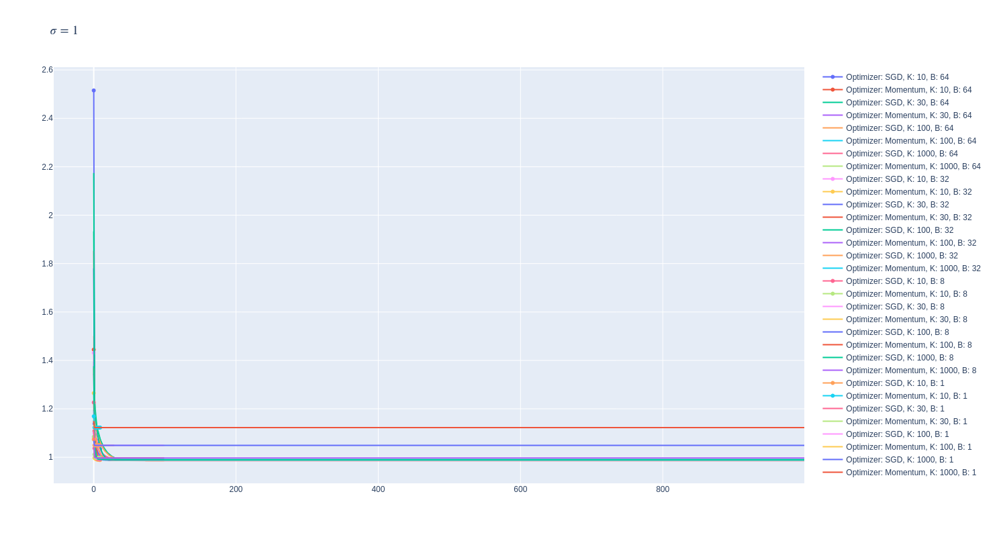

In [21]:
plot_loss_history(sigma, history)

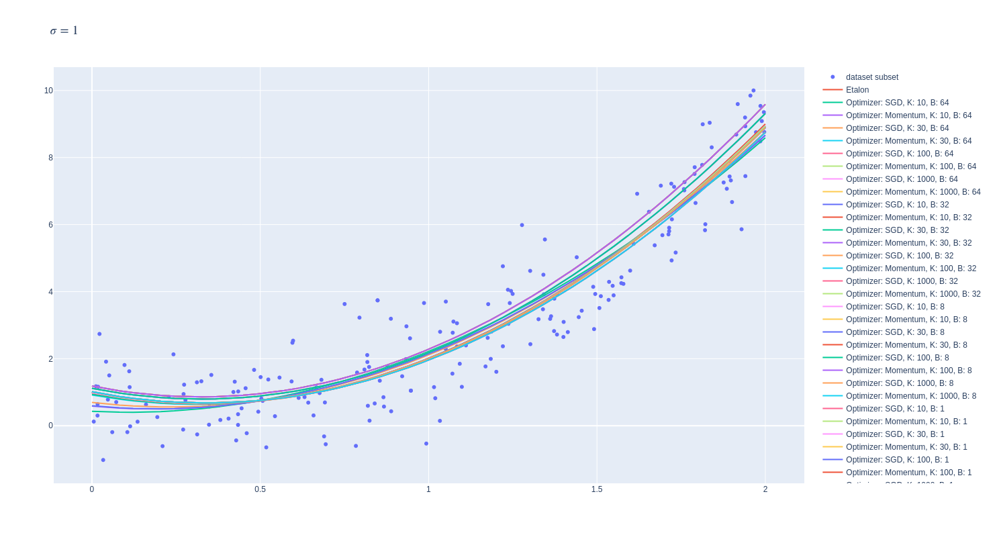

In [22]:
plot_fitted_fns(x, y, sigma, history)

### $\sigma=10$

In [23]:
sigma=10

In [24]:
x, y, history, records = fit(sigma)
records

Total:   0%|          | 0/32 [00:00<?, ?it/s]

Model:   0%|          | 0/10 [00:00<?, ?it/s]

Model:   0%|          | 0/10 [00:00<?, ?it/s]

Model:   0%|          | 0/30 [00:00<?, ?it/s]

Model:   0%|          | 0/30 [00:00<?, ?it/s]

Model:   0%|          | 0/100 [00:00<?, ?it/s]

Model:   0%|          | 0/100 [00:00<?, ?it/s]

Model:   0%|          | 0/1000 [00:00<?, ?it/s]

Model:   0%|          | 0/1000 [00:00<?, ?it/s]

Model:   0%|          | 0/10 [00:00<?, ?it/s]

Model:   0%|          | 0/10 [00:00<?, ?it/s]

Model:   0%|          | 0/30 [00:00<?, ?it/s]

Model:   0%|          | 0/30 [00:00<?, ?it/s]

Model:   0%|          | 0/100 [00:00<?, ?it/s]

Model:   0%|          | 0/100 [00:00<?, ?it/s]

Model:   0%|          | 0/1000 [00:00<?, ?it/s]

Model:   0%|          | 0/1000 [00:00<?, ?it/s]

Model:   0%|          | 0/10 [00:00<?, ?it/s]

Model:   0%|          | 0/10 [00:00<?, ?it/s]

Model:   0%|          | 0/30 [00:00<?, ?it/s]

Model:   0%|          | 0/30 [00:00<?, ?it/s]

Model:   0%|          | 0/100 [00:00<?, ?it/s]

Model:   0%|          | 0/100 [00:00<?, ?it/s]

Model:   0%|          | 0/1000 [00:00<?, ?it/s]

Model:   0%|          | 0/1000 [00:00<?, ?it/s]

Model:   0%|          | 0/10 [00:00<?, ?it/s]

Model:   0%|          | 0/10 [00:00<?, ?it/s]

Model:   0%|          | 0/30 [00:00<?, ?it/s]

Model:   0%|          | 0/30 [00:00<?, ?it/s]

Model:   0%|          | 0/100 [00:00<?, ?it/s]

Model:   0%|          | 0/100 [00:00<?, ?it/s]

Model:   0%|          | 0/1000 [00:00<?, ?it/s]

Model:   0%|          | 0/1000 [00:00<?, ?it/s]

,optimizer,K,B,a,b,c,Etalon MSE
0,SGD,10,64,2.360799,-0.808991,0.229249,0.807046
1,Momentum,10,64,2.273161,-0.836337,0.266185,0.806964
2,SGD,30,64,2.740580,-1.612627,0.536781,0.143976
3,Momentum,30,64,2.753857,-1.850633,0.652861,0.067801
4,SGD,100,64,2.914711,-1.981102,0.677793,0.037150
5,Momentum,100,64,2.839335,-2.030996,0.721620,0.034756
6,SGD,1000,64,2.925089,-2.003062,0.686196,0.034698
7,Momentum,1000,64,2.839408,-2.031151,0.721679,0.034741
8,SGD,10,32,2.275194,-0.884625,0.270959,0.766968
9,Momentum,10,32,2.502138,-1.739636,0.674604,0.140513


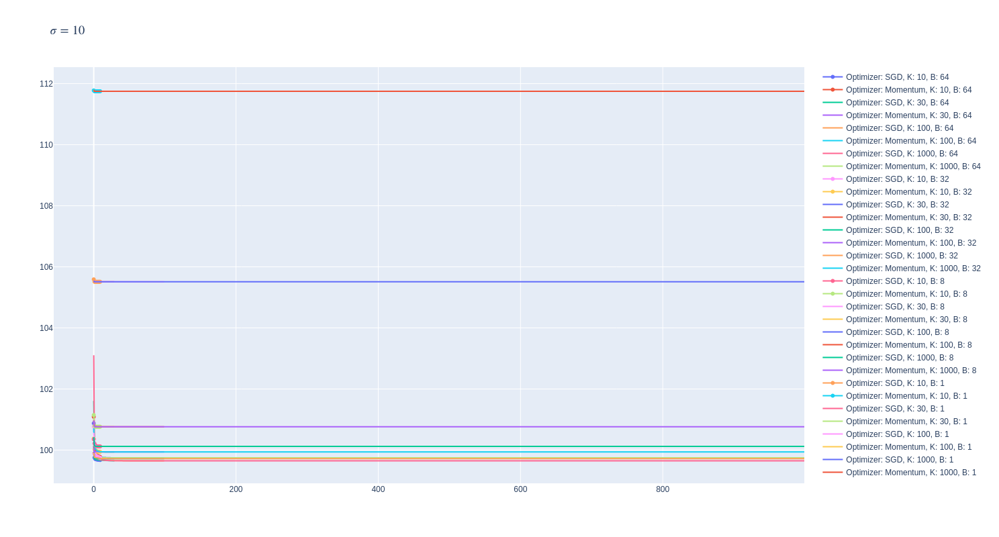

In [25]:
plot_loss_history(sigma, history)

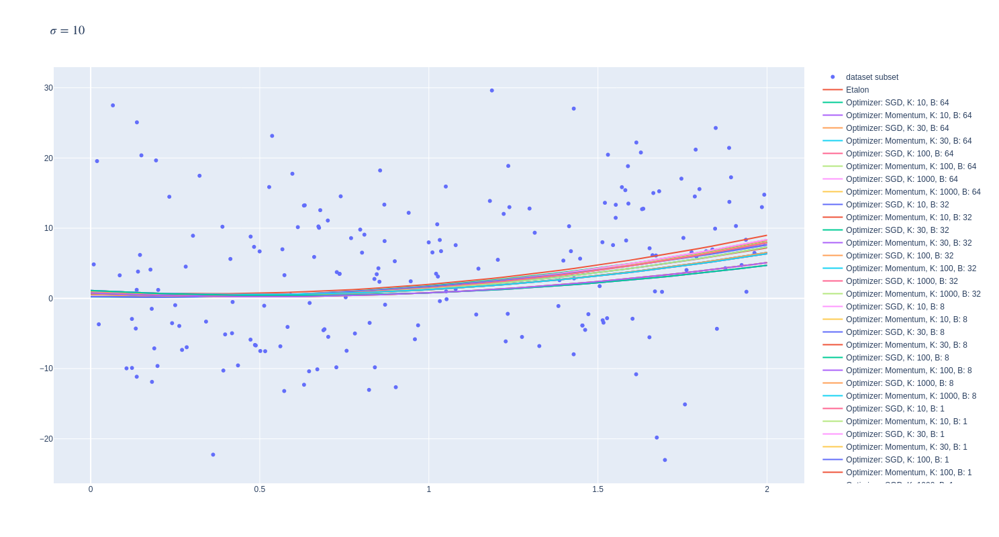

In [26]:
plot_fitted_fns(x, y, sigma, history)